# Libraries

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import plotly.express as px


In [45]:
import catboost as cb
# import load_boston
# from matplotlib import pyplot as pltfrom sklearn.datasets 
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.inspection import permutation_importance

# Data

In [4]:
dir_paths = ['oil.csv','sample_submission.csv', 'holidays_events.csv','stores.csv','train.csv','test.csv','transactions.csv']
all_dfs = {}
for p in dir_paths:
    name_df = p.split('/')[-1].split('.')[0]
    all_dfs[name_df] = pd.read_csv(p)

In [5]:
names_dfs = list(all_dfs.keys())
for n in names_dfs:
    print(n)
    display(all_dfs[n][0:5])

oil


,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


sample_submission


,id,sales
0,3000888,0.0
1,3000889,0.0
2,3000890,0.0
3,3000891,0.0
4,3000892,0.0


holidays_events


,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


stores


,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


train


,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


test


,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


transactions


,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [358]:
all_dfs['stores'].cluster.unique()

array([13,  8,  9,  4,  6, 15,  7,  3, 12, 16,  1, 10,  2,  5, 11, 14, 17])

In [ ]:
display(all_dfs['train'].sort_values(['store_nbr','family', 'date']))

In [203]:
train_hol_df = pd.merge(all_dfs['holidays_events'], all_dfs['train'], on='date', how='right')
train_hol_df['date'] = pd.to_datetime(train_hol_df['date'])

In [178]:
oil_df = all_dfs['oil']
oil_df['date'] = pd.to_datetime(oil_df['date'])

In [199]:
oil_df = pd.merge(oil_df, pd.DataFrame({'date':pd.date_range(start=oil_df['date'].min().strftime('%Y-%m-%d'), end=oil_df['date'].max().strftime('%Y-%m-%d'))}),
                 on='date', how='right')
oil_df['dcoilwtico'] = oil_df['dcoilwtico'].fillna(oil_df['dcoilwtico'].rolling(5,min_periods=1).mean())

In [204]:
train_hol_df = pd.merge(train_hol_df, oil_df, on='date', how='left')

In [208]:
train_hol_df.melt(id_vars='date', value_vars=['dcoilwtico', 'sales'], value_name='oil_vs_sales').sort_values(['oil_vs_sales', 'date'])

,date,variable,oil_vs_sales
3054348,2013-01-01,sales,0.0
3054349,2013-01-01,sales,0.0
3054350,2013-01-01,sales,0.0
3054351,2013-01-01,sales,0.0
3054352,2013-01-01,sales,0.0
...,...,...,...
1777,2013-01-01,dcoilwtico,NaN
1778,2013-01-01,dcoilwtico,NaN
1779,2013-01-01,dcoilwtico,NaN
1780,2013-01-01,dcoilwtico,NaN


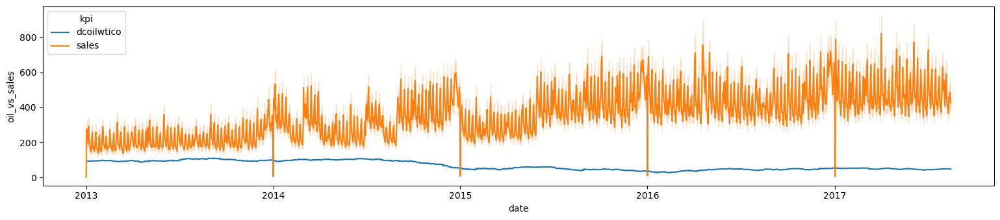

In [209]:
sns.lineplot(train_hol_df.melt(id_vars='date', value_vars=['dcoilwtico', 'sales'], value_name='oil_vs_sales', var_name='kpi').sort_values(['kpi', 'date']), 
             x='date', y='oil_vs_sales', hue='kpi')
plt.show()

In [206]:
train_hol_df.sort_values(['store_nbr', 'family', 'date'])

,date,type,locale,locale_name,description,transferred,id,store_nbr,family,sales,onpromotion,dcoilwtico
0,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,0,1,AUTOMOTIVE,0.0,0,NaN
1782,2013-01-02,NaN,NaN,NaN,NaN,NaN,1782,1,AUTOMOTIVE,2.0,0,93.140000
3564,2013-01-03,NaN,NaN,NaN,NaN,NaN,3564,1,AUTOMOTIVE,3.0,0,92.970000
5346,2013-01-04,NaN,NaN,NaN,NaN,NaN,5346,1,AUTOMOTIVE,3.0,0,93.120000
7128,2013-01-05,Work Day,National,Ecuador,Recupero puente Navidad,False,7128,1,AUTOMOTIVE,5.0,0,93.076667
...,...,...,...,...,...,...,...,...,...,...,...,...
3047087,2017-08-11,Transfer,National,Ecuador,Traslado Primer Grito de Independencia,False,2993627,54,SEAFOOD,0.0,0,48.810000
3048869,2017-08-12,NaN,NaN,NaN,NaN,NaN,2995409,54,SEAFOOD,1.0,1,49.002500
3050651,2017-08-13,NaN,NaN,NaN,NaN,NaN,2997191,54,SEAFOOD,2.0,0,48.980000
3052433,2017-08-14,NaN,NaN,NaN,NaN,NaN,2998973,54,SEAFOOD,0.0,0,47.590000


In [273]:
transaction_df = all_dfs['transactions']
transaction_df['date'] = pd.to_datetime(transaction_df['date'])
train_hol_df = pd.merge(train_hol_df, transaction_df, on=['store_nbr','date'], how='left')

In [274]:
train_hol_df.loc[(train_hol_df['transactions'].isnull())&(train_hol_df['sales']==0),'transactions'] = 0

/Users/endamu/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning:

divide by zero encountered in log



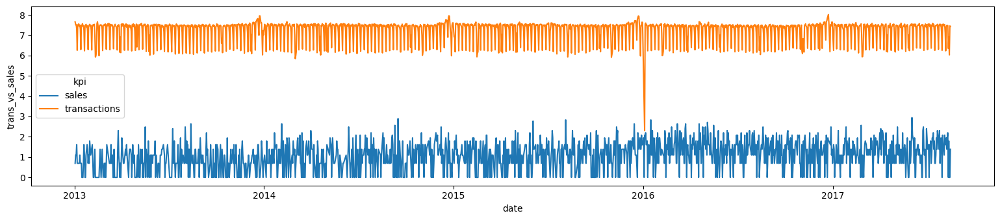

In [277]:
check_trans_df = (train_hol_df.query('store_nbr==1 and family=="AUTOMOTIVE"')
                  .melt(id_vars='date', value_vars=['transactions', 'sales'], 
                               value_name='trans_vs_sales', var_name='kpi'))
(sns.lineplot(check_trans_df.assign(trans_vs_sales=np.log(check_trans_df['trans_vs_sales']))
              .sort_values(['kpi', 'date']), 
             x='date', y='trans_vs_sales', hue='kpi'))
plt.show()

In [289]:
ma_trans.shape

(3054348,)

In [292]:
# train_hol_df.loc[(train_hol_df['transactions'].isnull())].sort_values(['store_nbr', 'family', 'date'])
train_hol_df['ma_trans'] = train_hol_df.groupby(['store_nbr', 'family'], as_index=False)['transactions'].apply(
    lambda x:x.rolling(6,min_periods=3).mean()).values
train_hol_df['transactions'].fillna(train_hol_df['ma_trans'], inplace=True)

In [294]:
# check_trans_df = (train_hol_df.query('store_nbr==1 and family=="AUTOMOTIVE"')
#                   .melt(id_vars='date', value_vars=['transactions', 'sales'], 
#                                value_name='trans_vs_sales', var_name='kpi'))
# (sns.lineplot(check_trans_df.assign(trans_vs_sales=np.log(check_trans_df['trans_vs_sales']))
#               .sort_values(['kpi', 'date']), 
#              x='date', y='trans_vs_sales', hue='kpi'))
# plt.show()

In [316]:
top_selling_fams = (train_hol_df[['family', 'sales']].groupby('family', as_index=False)
 .sum('sales').sort_values('sales', ascending=False)).family.to_list()

In [318]:
# top_selling_fams

In [326]:
# (train_hol_df[['family', 'sales']].groupby('family', as_index=False)
#  .sum('sales').sort_values('sales', ascending=False))

In [7]:
def get_unique(l):
    l = list(l)
    l = np.unique(l)
    return l

In [7]:
# (train_hol_df['date'].max()-train_hol_df['date'].min()).days/365
check_hol_df = train_hol_df.groupby('type', as_index=False).agg({'date':list})
check_hol_df['date'] = check_hol_df['date'].map(lambda x:np.unique(x))

In [8]:
only_holidays_df = train_hol_df.loc[~train_hol_df.type.isna(), ['type','date']].drop_duplicates().sort_values(['type','date'])
only_holidays_df['lower_window'] = -5
only_holidays_df['upper_window'] = 2

In [319]:
train_hol_df.family.unique()

array(['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BOOKS',
       'BREAD/BAKERY', 'CELEBRATION', 'CLEANING', 'DAIRY', 'DELI', 'EGGS',
       'FROZEN FOODS', 'GROCERY I', 'GROCERY II', 'HARDWARE',
       'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES',
       'HOME CARE', 'LADIESWEAR', 'LAWN AND GARDEN', 'LINGERIE',
       'LIQUOR,WINE,BEER', 'MAGAZINES', 'MEATS', 'PERSONAL CARE',
       'PET SUPPLIES', 'PLAYERS AND ELECTRONICS', 'POULTRY',
       'PREPARED FOODS', 'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES',
       'SEAFOOD'], dtype=object)

In [ ]:
g = sns.lineplot(train_hol_df.query('store_nbr==1 and family=="GROCERY I" and date>="2015-02-11" and date<="2015-02-21"'), 
                                x='date', y='sales')
plt.axvline(pd.to_datetime('2015-02-16'), 0)
# g.refline(y = 0,x=pd.to_datetime('2015-02-16'),
#           color = "blue",
#           lw = 3)



# Modelling

In [9]:
from prophet import Prophet

In [320]:
fp_train_df = train_hol_df.rename(columns={'sales':'y', 'date':'ds'})
only_holidays_df.rename(columns={'type':'holiday', 'date':'ds'}, inplace=True)
fp_train_df['store_family'] = fp_train_df['store_nbr'].astype(str) + '_' + fp_train_df['family']

In [11]:
def encode_cyclical(df, period, useSine=True):
    """
    returns the sine and cosine of the input value, scaled to the unit interval
    """
    trs1 = 2 * np.pi * df.ds.dt.dayofweek / period
#     input_x = 2 * np.pi * (a / period)
    if useSine:
#         (2 * pi * pl.col("DoW") / 7).sin()
        x = np.sin(trs1)
    else:
        x = np.cos(trs1)
    return x

In [322]:
# fp_train_df.family.unique()

In [323]:
fp_train_df['DoW_sin'] = encode_cyclical(df=fp_train_df, period=7, useSine=True)
fp_train_df['DoW_cos'] = encode_cyclical(df=fp_train_df, period=7, useSine=False)
fp_train_df['WoY_cos'] = encode_cyclical(df=fp_train_df, period=52, useSine=False)
fp_train_df['WoY_sin'] = encode_cyclical(df=fp_train_df, period=52, useSine=True)

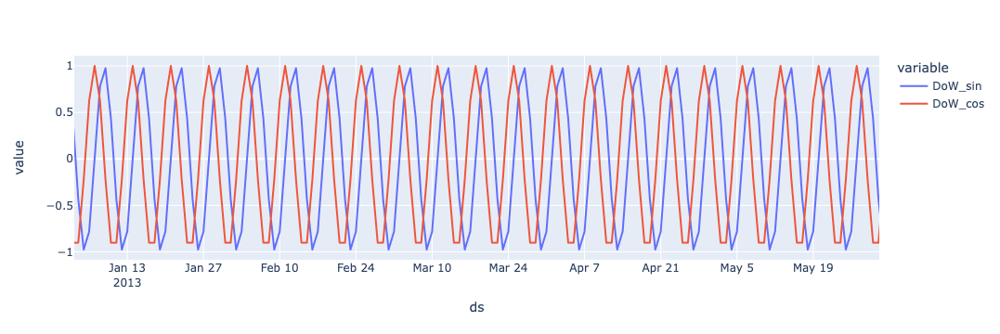

In [249]:
fig = px.line(fp_train_df.query('store_nbr==1 and family=="BEVERAGES"').sort_values('ds'),
              x='ds', y=['DoW_sin','DoW_cos'] )
fig.show()

In [223]:
print(fp_train_df.ds.min())
print(fp_train_df.ds.max())

2013-01-01 00:00:00
2017-08-15 00:00:00


In [308]:
2400+2983

5383

In [14]:
# import random
# store_fam_list = fp_train_df['store_family'].unique()
# random.shuffle(store_fam_list)
# train_index = int(round(len(store_fam_list)*0.8))
# train_list = store_fam_list[0:train_index]
# test_list = store_fam_list[train_index:]

In [238]:
# fp_train_df.loc[fp_train_df['ds']<"2017-05-01 00:00:00"]

In [250]:
def warm_start_params(m):
    """
    Retrieve parameters from a trained model in the format used to initialize a new Stan model.
    Note that the new Stan model must have these same settings:
        n_changepoints, seasonality features, mcmc sampling
    for the retrieved parameters to be valid for the new model.

    Parameters
    ----------
    m: A trained model of the Prophet class.

    Returns
    -------
    A Dictionary containing retrieved parameters of m.
    """
    res = {}
    for pname in ['k', 'm', 'sigma_obs']:
        if m.mcmc_samples == 0:
            res[pname] = m.params[pname][0][0]
        else:
            res[pname] = np.mean(m.params[pname])
    for pname in ['delta', 'beta']:
        if m.mcmc_samples == 0:
            res[pname] = m.params[pname][0]
        else:
            res[pname] = np.mean(m.params[pname], axis=0)
    return res

In [252]:
store_fams = fp_train_df.store_family.unique()

In [330]:
top_selling_strs = (fp_train_df.groupby('store_nbr', as_index=False)
                    .sum('y').sort_values('y', ascending=False)
                    [['store_nbr', 'y']].store_nbr.tolist())

In [335]:
# # fp_train_df.store_family.unique()
# (store_fam_train.query(f'store_nbr=={store} and family=="{fam}"')
#                                .sort_values(['store_family','ds'])[['y', 'ds']+predictors])

,y,ds,onpromotion,dcoilwtico,transactions,store_family,DoW_sin,DoW_cos,WoY_cos,WoY_sin
1266,0.0,2013-01-01,0,NaN,0.0,44_GROCERY I,0.781831,0.623490,0.992709,0.120537
3048,10686.0,2013-01-02,0,93.140000,4821.0,44_GROCERY I,0.974928,-0.222521,0.970942,0.239316
4830,7342.0,2013-01-03,0,92.970000,3618.0,44_GROCERY I,0.433884,-0.900969,0.935016,0.354605
6612,7250.0,2013-01-04,0,93.120000,4169.0,44_GROCERY I,-0.433884,-0.900969,0.885456,0.464723
8394,10699.0,2013-01-05,0,93.076667,4921.0,44_GROCERY I,-0.974928,-0.222521,0.822984,0.568065
...,...,...,...,...,...,...,...,...,...,...
2850684,8911.0,2017-04-26,116,49.220000,4307.0,44_GROCERY I,0.974928,-0.222521,0.970942,0.239316
2852466,7160.0,2017-04-27,106,48.960000,3756.0,44_GROCERY I,0.433884,-0.900969,0.935016,0.354605
2854248,10536.0,2017-04-28,111,49.310000,4391.0,44_GROCERY I,-0.433884,-0.900969,0.885456,0.464723
2856030,14400.0,2017-04-29,99,49.177500,5032.0,44_GROCERY I,-0.974928,-0.222521,0.822984,0.568065


In [351]:
m.regressor_column_matrix.

<bound method Prophet.regressor_column_matrix of <prophet.forecaster.Prophet object at 0x1a36d62d0>>

In [324]:
predictors = ['onpromotion', 'dcoilwtico',
       'transactions', 'store_family', 'DoW_sin', 'DoW_cos',
       'WoY_cos', 'WoY_sin']

In [ ]:
store_fams = fp_train_df.store_family.unique()
store_forecast_dict = {}
# for store_fam in store_fams[0:10]:
store_fam_train = fp_train_df.query('ds<"2017-05-01"')
only_holidays_df = (store_fam_train.loc[~store_fam_train.type.isna(), ['type','ds']]
                    .drop_duplicates().sort_values(['type','ds']))
only_holidays_df['lower_window'] = -5
only_holidays_df['upper_window'] = 2

# m.add_seasonality(name='yearly', period=365, fourier_order=20)
# m.add_seasonality(name='monthly', period=30, fourier_order=12)
# m.add_seasonality(name='weekly', period=7, fourier_order=10)
# m.add_seasonality(name='daily', period=1, fourier_order=15)
models_dict = dict()
for store in top_selling_strs:
        for fam in top_selling_fams[0:10]:
            m = Prophet(holidays = only_holidays_df.rename(columns={'type':'holiday'}),
                    # seasonality_mode = 'multiplicative',
                    # seasonality_prior_scale = 20,
                    # changepoint_prior_scale = 0.1,
                    # holidays_prior_scale = 10,
                   scaling="minmax")

            fit_model = (Prophet().fit(store_fam_train.query(f'store_nbr=={store} and family=="{fam}"')
                                           .sort_values(['store_family','ds'])[['y', 'ds']+predictors])
                            )  # Adding the last day, fitt
            models_dict[str(store) + '_' + fam] = fit_model

    #     forecast = m.predict(fp_train_df[['ds','onpromotion', 'store_family']])


In [392]:
store_forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,8038.614559,4201.524046,10977.145160,8038.614559,8038.614559,-494.515659,-494.515659,-494.515659,-1284.680519,-1284.680519,-1284.680519,790.164860,790.164860,790.164860,0.0,0.0,0.0,7544.098900
1,2013-01-02,8040.954071,4856.672844,11230.116037,8040.954071,8040.954071,-166.389904,-166.389904,-166.389904,-700.560198,-700.560198,-700.560198,534.170294,534.170294,534.170294,0.0,0.0,0.0,7874.564167
2,2013-01-03,8043.293582,2961.936741,9319.757534,8043.293582,8043.293582,-2039.587678,-2039.587678,-2039.587678,-2337.509587,-2337.509587,-2337.509587,297.921908,297.921908,297.921908,0.0,0.0,0.0,6003.705904
3,2013-01-04,8045.633094,3783.214463,10122.499244,8045.633094,8045.633094,-1103.310277,-1103.310277,-1103.310277,-1187.331254,-1187.331254,-1187.331254,84.020978,84.020978,84.020978,0.0,0.0,0.0,6942.322817
4,2013-01-05,8047.972605,7480.638675,14142.036034,8047.972605,8047.972605,2624.605479,2624.605479,2624.605479,2730.106493,2730.106493,2730.106493,-105.501014,-105.501014,-105.501014,0.0,0.0,0.0,10672.578084
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1709,2017-08-11,11642.169863,6403.001190,12779.326398,11631.751643,11651.167962,-2138.428692,-2138.428692,-2138.428692,-1187.331254,-1187.331254,-1187.331254,-951.097437,-951.097437,-951.097437,0.0,0.0,0.0,9503.741171
1710,2017-08-12,11644.528749,10449.730639,16926.899178,11634.010000,11653.652003,1870.810772,1870.810772,1870.810772,2730.106493,2730.106493,2730.106493,-859.295721,-859.295721,-859.295721,0.0,0.0,0.0,13515.339521
1711,2017-08-13,11646.887636,11195.319977,17842.219676,11636.168981,11656.212363,2807.884673,2807.884673,2807.884673,3569.486936,3569.486936,3569.486936,-761.602263,-761.602263,-761.602263,0.0,0.0,0.0,14454.772309
1712,2017-08-14,11649.246523,6677.598795,13394.999387,11638.295449,11658.726647,-1449.333573,-1449.333573,-1449.333573,-789.511871,-789.511871,-789.511871,-659.821702,-659.821702,-659.821702,0.0,0.0,0.0,10199.912951


In [373]:
# store_fams #= store_fam_train.store_family.unique()[0:5]
# str_df
model_store_fams = models_dict.keys()

In [393]:
pred_dict = {}
for store_fam in model_store_fams:
    str_df = fp_train_df.query(f'store_family=="{store_fam}"')
    store_forecast = models_dict[store_fam].predict(str_df[['ds']+predictors])
    store_forecast = store_forecast[["ds", "yhat", "trend", "weekly", "yearly", 
                                    "additive_terms"]]
#     store_forecast['y'] = fp_test_df['y']
    store_forecast['store_family'] = store_fam
    pred_dict[store_fam] = store_forecast

In [375]:
# model_store_fams

In [353]:
store_fams = list(pred_dict.keys())

In [376]:
models_dict[list(model_store_fams)[0]]

In [386]:
pred_dict[list(model_store_fams)[0]]

,ds,yhat,trend,store_family
0,2013-01-01,7544.098900,8038.614559,44_GROCERY I
1,2013-01-02,7874.564167,8040.954071,44_GROCERY I
2,2013-01-03,6003.705904,8043.293582,44_GROCERY I
3,2013-01-04,6942.322817,8045.633094,44_GROCERY I
4,2013-01-05,10672.578084,8047.972605,44_GROCERY I
...,...,...,...,...
1709,2017-08-11,9503.741171,11642.169863,44_GROCERY I
1710,2017-08-12,13515.339521,11644.528749,44_GROCERY I
1711,2017-08-13,14454.772309,11646.887636,44_GROCERY I
1712,2017-08-14,10199.912951,11649.246523,44_GROCERY I


In [382]:
only_holidays_df.query('ds=="2014-12-16"')

,type,ds,lower_window,upper_window


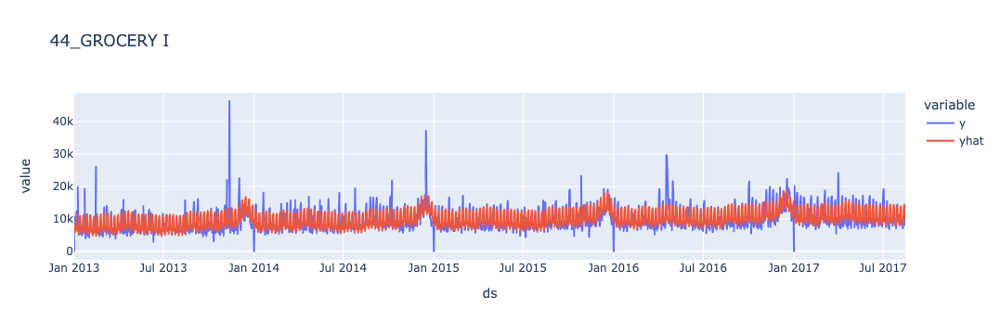

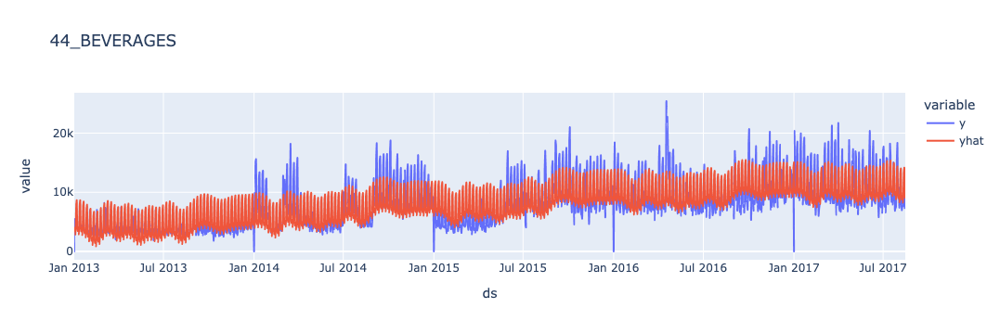

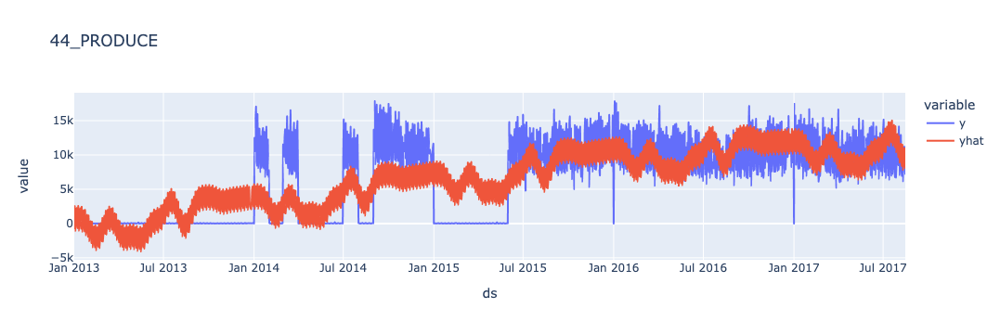

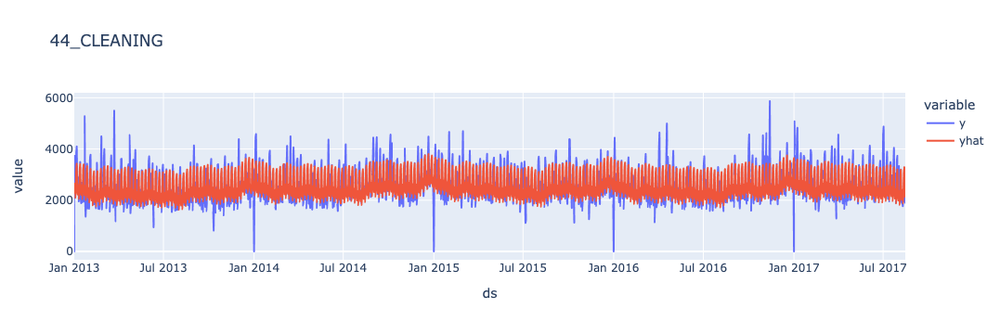

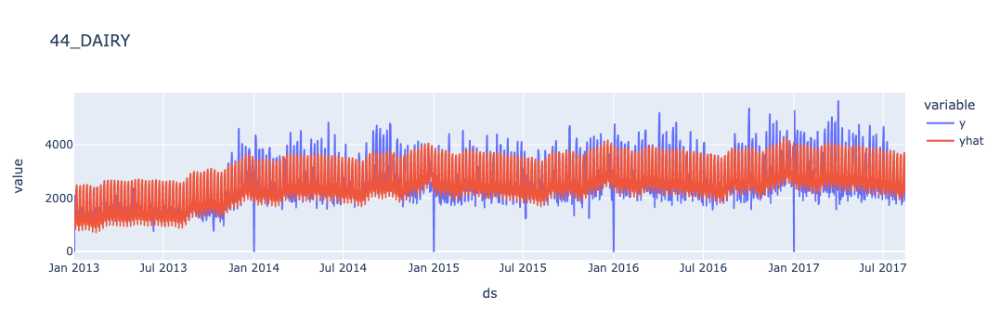

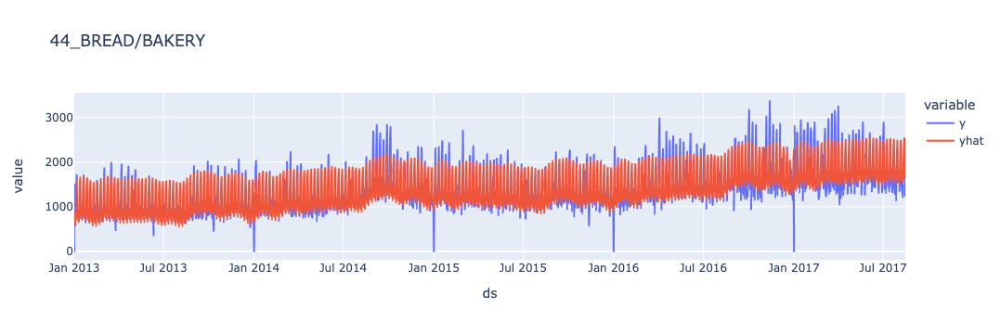

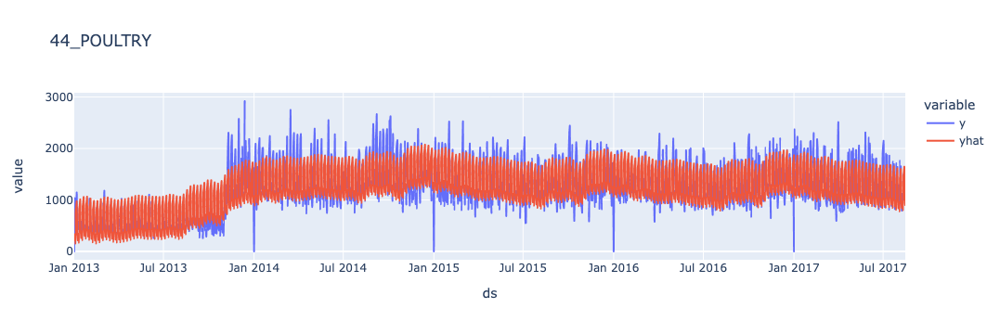

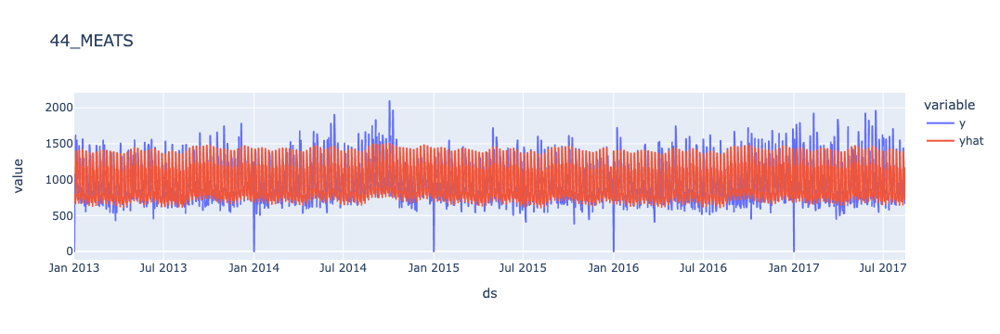

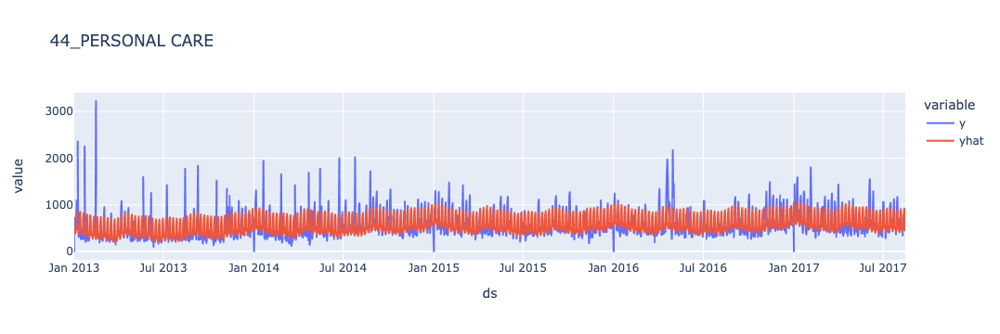

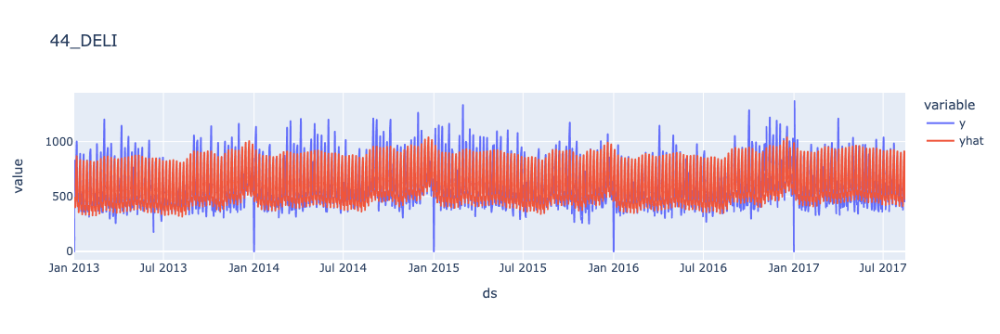

In [383]:
for store_fam in list(pred_dict.keys())[0:10]:
    plt_data = pd.merge(pred_dict[store_fam], 
                        fp_train_df.query(f"store_family=='{store_fam}'")[['ds', 'y']], 
                        on='ds')
    fig = px.line(plt_data, x='ds', y=['y', 'yhat'], title=store_fam)
    fig.show()

In [398]:
train_hol_df

,date,type,locale,locale_name,description,transferred,id,store_nbr,family,sales,onpromotion,dcoilwtico,transactions,ma_trans
0,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,0,1,AUTOMOTIVE,0.000,0,NaN,0.0,NaN
1,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,1,1,BABY CARE,0.000,0,NaN,0.0,NaN
2,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,2,1,BEAUTY,0.000,0,NaN,0.0,1314.666667
3,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,3,1,BEVERAGES,0.000,0,NaN,0.0,1451.750000
4,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,4,1,BOOKS,0.000,0,NaN,0.0,1463.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3054343,2017-08-15,Holiday,Local,Riobamba,Fundacion de Riobamba,False,3000883,9,POULTRY,438.133,0,47.57,2155.0,807.500000
3054344,2017-08-15,Holiday,Local,Riobamba,Fundacion de Riobamba,False,3000884,9,PREPARED FOODS,154.553,1,47.57,2155.0,780.500000
3054345,2017-08-15,Holiday,Local,Riobamba,Fundacion de Riobamba,False,3000885,9,PRODUCE,2419.729,148,47.57,2155.0,815.833333
3054346,2017-08-15,Holiday,Local,Riobamba,Fundacion de Riobamba,False,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,47.57,2155.0,826.833333


In [395]:
pred_dict[store_fam]

,ds,yhat,trend,weekly,yearly,additive_terms,store_family
0,2013-01-01,-4.218188,-0.231541,-1.254051,-2.732596,-3.986647,52_DELI
1,2013-01-02,-4.133274,-0.231052,-1.364812,-2.537410,-3.902222,52_DELI
2,2013-01-03,-3.183118,-0.230563,-0.529944,-2.422611,-2.952555,52_DELI
3,2013-01-04,-1.657617,-0.230074,0.964651,-2.392194,-1.427543,52_DELI
4,2013-01-05,-1.143959,-0.229585,1.533096,-2.447470,-0.914374,52_DELI
...,...,...,...,...,...,...,...
1709,2017-08-11,67.581842,65.076952,0.964651,1.540238,2.504890,52_DELI
1710,2017-08-12,68.693538,65.256458,1.533096,1.903984,3.437080,52_DELI
1711,2017-08-13,69.527556,65.435964,1.883512,2.208080,4.091592,52_DELI
1712,2017-08-14,66.825115,65.615470,-1.232452,2.442097,1.209644,52_DELI


In [404]:
import xgboost as xgb


In [444]:
#get some variables
models_dict = dict()
for store_fam in list(pred_dict.keys()):
    store = int(store_fam.split('_')[0])
    family = store_fam.split('_')[1]
    hol_dumm_df = (pd.get_dummies(train_hol_df
                                  .query(f'store_nbr=={store} and family=="{family}" and date<"2017-05-01"')
                                  [['date', 'type', ]],
                                  columns=['type'], dtype=int).rename(columns={'date':'ds'}))
    df_xgb = pred_dict[store_fam].loc[:, ["ds","trend", "weekly", "yearly", "additive_terms"]]
    df_xgb = pd.merge(hol_dumm_df, df_xgb, on='ds')
    target_df = fp_train_df.query(f'store_nbr=={store} and family=="{family}" and ds<"2017-05-01"')[['ds', 'y']]
    df_xgb = pd.merge(df_xgb, target_df, on='ds')
    
    xgb_model = xgb.XGBRegressor()
    xgb_model.fit(df_xgb.iloc[:,1:-2].values, df_xgb.iloc[:,-1].values,)
    models_dict[store_fam] = xgb_model

In [452]:
train_hol_df.query(f'store_nbr=={store} and family=="{family}"')#[['date', 'y']]

,date,type,locale,locale_name,description,transferred,id,store_nbr,family,sales,onpromotion,dcoilwtico,transactions,ma_trans
1266,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,1266,44,GROCERY I,0.0,0,NaN,0.0,1551.000000
3048,2013-01-02,NaN,NaN,NaN,NaN,NaN,3048,44,GROCERY I,10686.0,0,93.140000,4821.0,1677.500000
4830,2013-01-03,NaN,NaN,NaN,NaN,NaN,4830,44,GROCERY I,7342.0,0,92.970000,3618.0,1441.000000
6612,2013-01-04,NaN,NaN,NaN,NaN,NaN,6612,44,GROCERY I,7250.0,0,93.120000,4169.0,1779.833333
8394,2013-01-05,Work Day,National,Ecuador,Recupero puente Navidad,False,8394,44,GROCERY I,10699.0,0,93.076667,4921.0,1662.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046704,2017-08-11,Transfer,National,Ecuador,Traslado Primer Grito de Independencia,False,2993244,44,GROCERY I,9979.0,38,48.810000,4418.0,843.833333
3048486,2017-08-12,NaN,NaN,NaN,NaN,NaN,2995026,44,GROCERY I,9391.0,39,49.002500,4277.0,907.333333
3050268,2017-08-13,NaN,NaN,NaN,NaN,NaN,2996808,44,GROCERY I,9811.0,41,48.980000,4392.0,839.833333
3052050,2017-08-14,NaN,NaN,NaN,NaN,NaN,2998590,44,GROCERY I,8318.0,39,47.590000,4039.0,791.500000


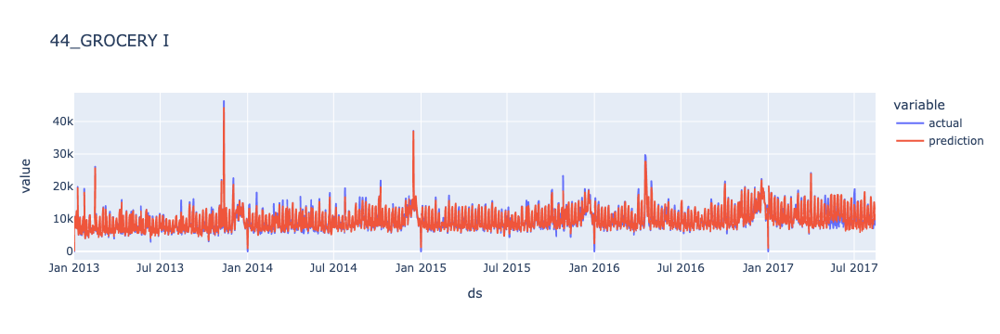

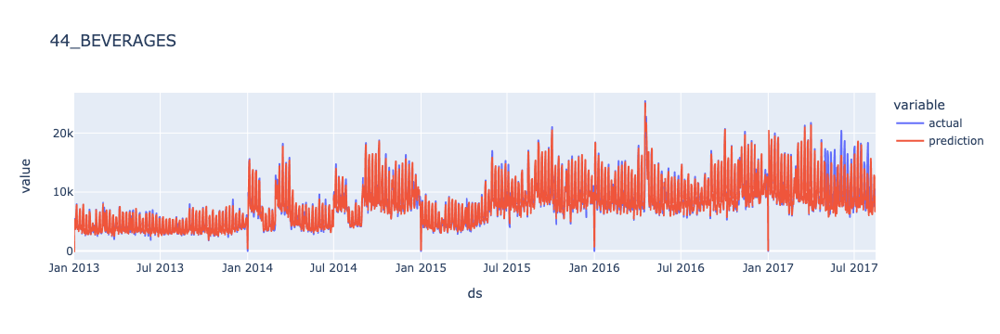

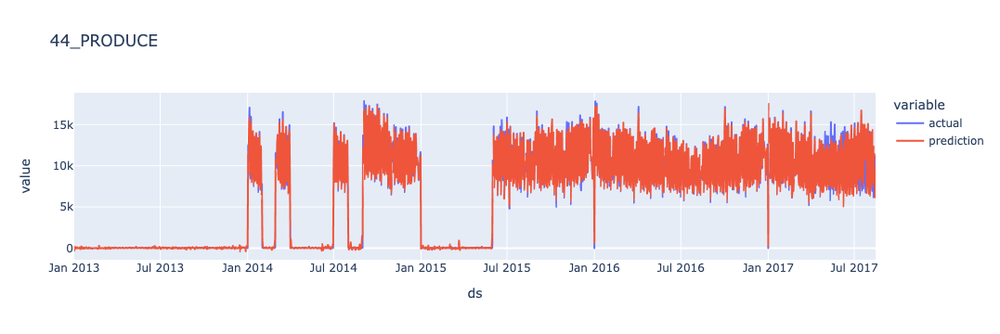

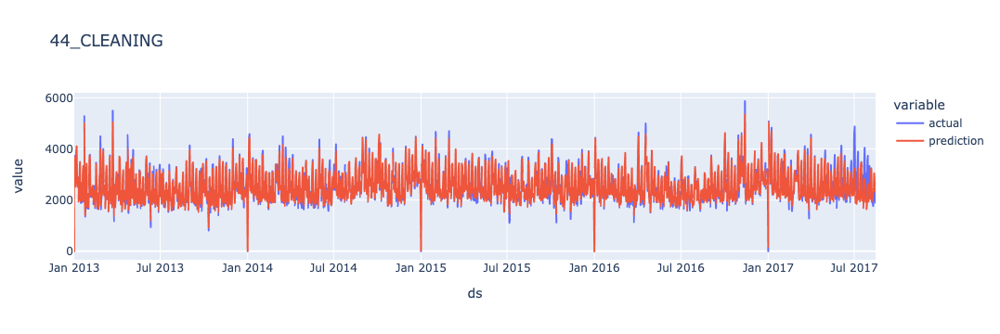

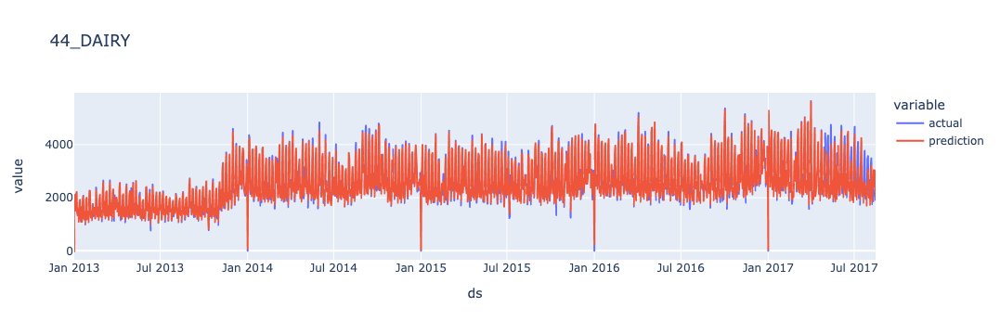

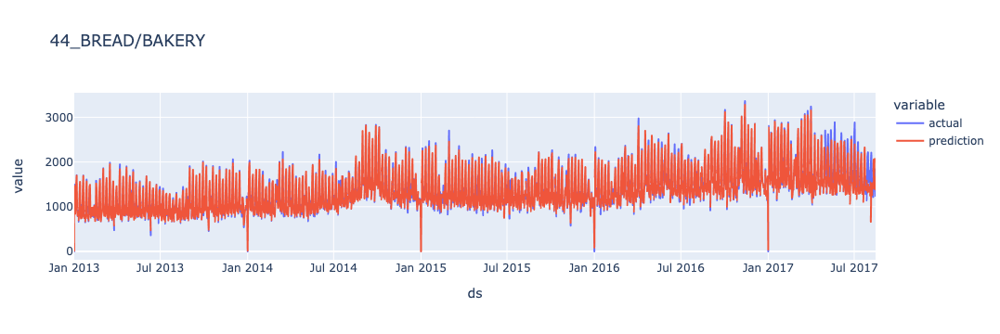

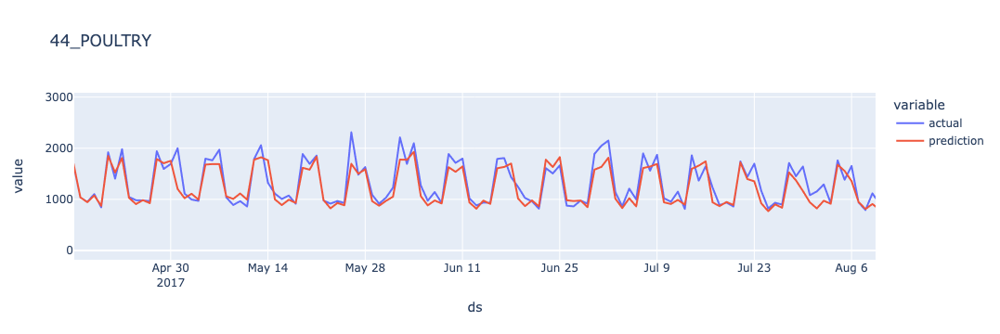

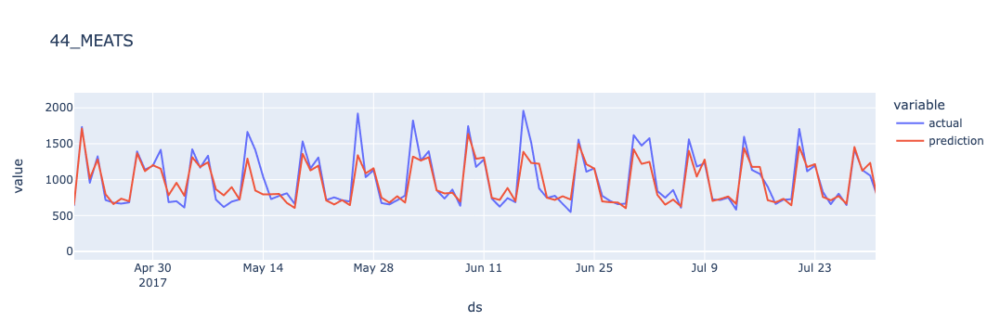

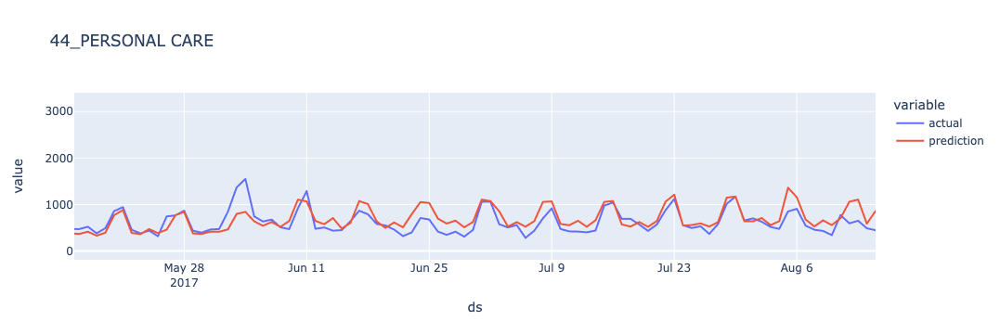

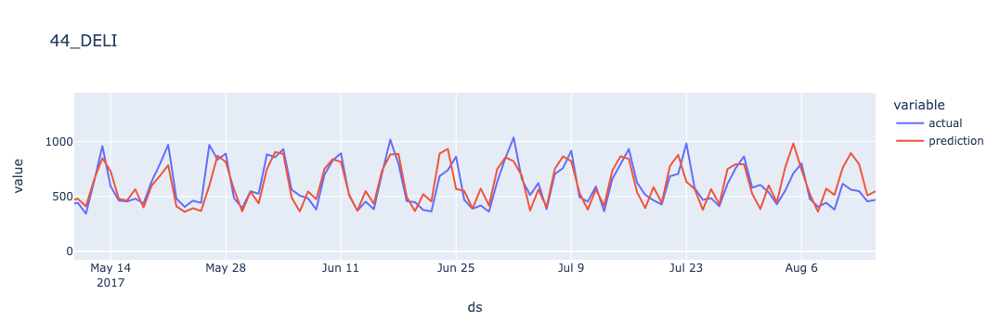

In [453]:
for store_fam in list(pred_dict.keys())[0:10]:
    store = int(store_fam.split('_')[0])
    family = store_fam.split('_')[1]
    df_xgb = pred_dict[store_fam].loc[:, ["ds","trend", "weekly", "yearly", "additive_terms"]]
    hol_dumm_df = (pd.get_dummies(train_hol_df
                                  .query(f'store_nbr=={store} and family=="{family}"')
                                  [['date', 'type', ]],
                                  columns=['type'], dtype=int).rename(columns={'date':'ds'}))
    df_xgb = pd.merge(hol_dumm_df, df_xgb, on='ds')
    
    yhat = models_dict[store_fam].predict(df_xgb.iloc[:,1:-1].values)
    pred_df = pd.DataFrame({'prediction':yhat,
                           'ds': df_xgb.ds.values})
    pred_df['store_family'] = store_fam
    pred_df = pd.merge(pred_df,
                       fp_train_df.query(f'store_nbr=={store} and family=="{family}"')[['y','ds']],
                      on='ds', how='right')
    
    fig = px.line(pred_df.rename(columns={'y':'actual'}), x='ds', y=['actual','prediction'], title=store_fam)
    fig.show()

In [436]:
pred_df

,prediction,actual,ds,store_family
0,-0.002119,0.000,2013-01-01,52_DELI
1,-0.003653,0.000,2013-01-02,52_DELI
2,-0.000012,0.000,2013-01-03,52_DELI
3,-0.000757,0.000,2013-01-04,52_DELI
4,0.001532,0.000,2013-01-05,52_DELI
...,...,...,...,...
1979,497.043945,497.079,2017-08-11,52_DELI
1980,381.177948,381.137,2017-08-12,52_DELI
1981,435.754181,435.742,2017-08-13,52_DELI
1982,274.704559,274.628,2017-08-14,52_DELI


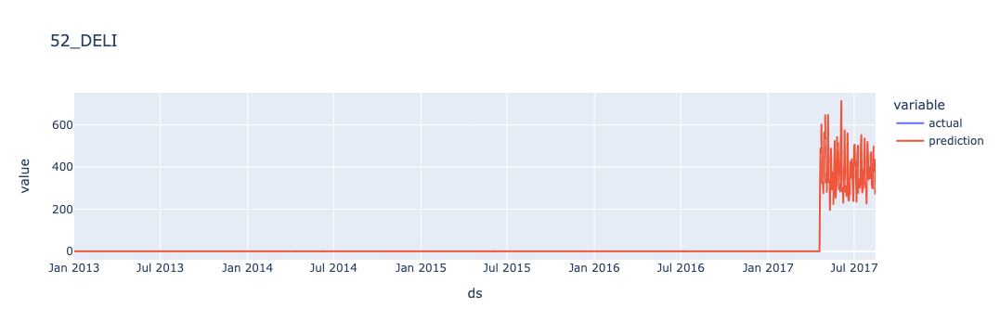

In [438]:
fig = px.line(pred_df, x='ds', y=['actual','prediction'], title=store_fam)
fig.show()

In [45]:
Train = xgb.DMatrix(df_xgb.iloc[:,1:-1], label = df_xgb.y)

Test = xgb.DMatrix(df_xgb.iloc[:,1:-1], label = df_xgb.y)

In [32]:
# set the parameters
parameters = {'learning_rate': 0.3,
              'max_depth': 6,
              'colsample_bytree': 1,
              'subsample': 1,
              'min_child_weight' : 1,
              'gamma': 0,
              'random_state': 1502,
              'eval_metric': "rmse",
              'objective': "reg:squarederror"}

In [46]:
model = xgb.train(params = parameters,
                  dtrain = Train,
                  num_boost_round = 40,
                  evals = [(Test, "y")])

[0]	y-rmse:1.74713
[1]	y-rmse:1.60228
[2]	y-rmse:1.51373
[3]	y-rmse:1.45666
[4]	y-rmse:1.40060
[5]	y-rmse:1.36255
[6]	y-rmse:1.33098
[7]	y-rmse:1.29894
[8]	y-rmse:1.27808
[9]	y-rmse:1.25645
[10]	y-rmse:1.23721
[11]	y-rmse:1.21714
[12]	y-rmse:1.19793
[13]	y-rmse:1.17460
[14]	y-rmse:1.16035
[15]	y-rmse:1.15399
[16]	y-rmse:1.14338
[17]	y-rmse:1.12834
[18]	y-rmse:1.11152
[19]	y-rmse:1.10074
[20]	y-rmse:1.09367
[21]	y-rmse:1.06440
[22]	y-rmse:1.05507
[23]	y-rmse:1.03760
[24]	y-rmse:1.03062
[25]	y-rmse:1.01116
[26]	y-rmse:1.00150
[27]	y-rmse:0.99687
[28]	y-rmse:0.98262
[29]	y-rmse:0.97231
[30]	y-rmse:0.95311
[31]	y-rmse:0.94323
[32]	y-rmse:0.93586
[33]	y-rmse:0.92212
[34]	y-rmse:0.91314
[35]	y-rmse:0.90881
[36]	y-rmse:0.89746
[37]	y-rmse:0.89430
[38]	y-rmse:0.88461
[39]	y-rmse:0.87132


In [51]:
predictions = pd.Series(model.predict(Test), name = "XGBoost")
predictions_df = pd.DataFrame({'ds':df_xgb.ds.values,
                              'yhat':predictions.values})

In [54]:
plt_xgb_df = pd.concat([predictions_df, df_xgb.y], axis=1)

In [55]:
fig = px.line(plt_xgb_df, x='ds', y=['y', 'yhat'])
fig.show()

In [52]:
# store_fam_train.query(f'store_family in "{tuple(train_list[0:100])}" and ds<"2017-05-01"')['y']

# Catboost

In [384]:
predictors

['onpromotion',
 'dcoilwtico',
 'transactions',
 'store_family',
 'DoW_sin',
 'DoW_cos',
 'WoY_cos',
 'WoY_sin']

In [86]:
train_dataset = (cb.Pool(fp_train_df
                         .query(f'store_family in {tuple(train_list[0:2000])} and ds<"2017-05-01"')
                         [predictors],
                        fp_train_df
                         .query(f'store_family in {tuple(train_list[0:2000])} and ds<"2017-05-01"')['y'],
                cat_features=['store_family']))
cat_model = cb.CatBoostRegressor(loss_function='RMSE', cat_features = ['store_family']) 

In [80]:
fp_train_df.columns

Index(['ds', 'type', 'locale', 'locale_name', 'description', 'transferred',
       'id', 'store_nbr', 'family', 'y', 'onpromotion', 'store_family',
       'DoW_sin', 'DoW_cos', 'WoY_cos', 'WoY_sin'],
      dtype='object')

In [87]:
grid = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}
cat_model.grid_search(grid, train_dataset, verbose=False)

0:	learn: 1130.2040391	test: 1129.8261012	best: 1129.8261012 (0)	total: 110ms	remaining: 10.9s
1:	learn: 1121.5569469	test: 1121.1589147	best: 1121.1589147 (1)	total: 197ms	remaining: 9.67s
2:	learn: 1113.1786709	test: 1112.7681680	best: 1112.7681680 (2)	total: 268ms	remaining: 8.65s
3:	learn: 1105.2327015	test: 1104.8072003	best: 1104.8072003 (3)	total: 340ms	remaining: 8.17s
4:	learn: 1097.7057930	test: 1097.2667126	best: 1097.2667126 (4)	total: 404ms	remaining: 7.68s
5:	learn: 1090.5471484	test: 1090.1194623	best: 1090.1194623 (5)	total: 486ms	remaining: 7.61s
6:	learn: 1083.8622901	test: 1083.4036972	best: 1083.4036972 (6)	total: 549ms	remaining: 7.3s
7:	learn: 1077.4153288	test: 1076.9569746	best: 1076.9569746 (7)	total: 616ms	remaining: 7.08s
8:	learn: 1071.3101165	test: 1070.8438667	best: 1070.8438667 (8)	total: 679ms	remaining: 6.86s
9:	learn: 1065.4520158	test: 1064.9415524	best: 1064.9415524 (9)	total: 748ms	remaining: 6.73s
10:	learn: 1060.0444045	test: 1059.5109816	best: 10

{'params': {'depth': 8,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5,
  'iterations': 200},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

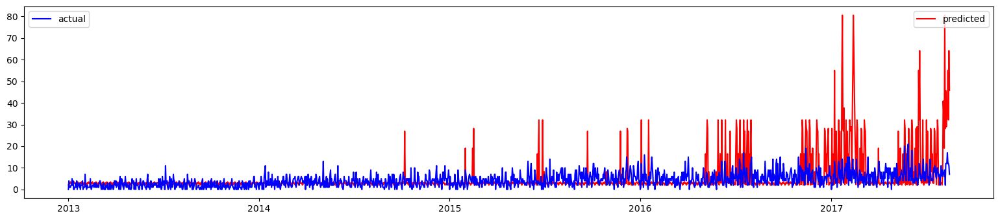

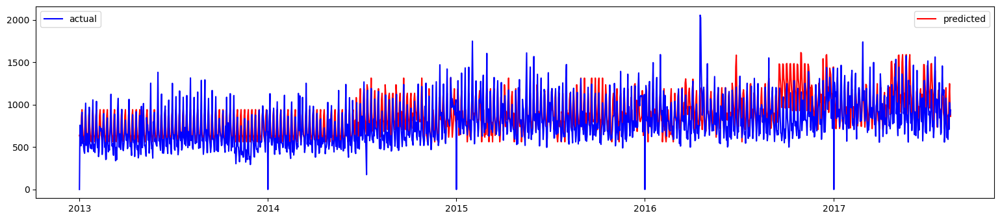

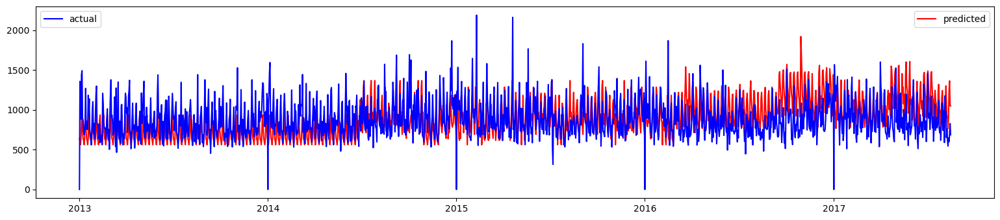

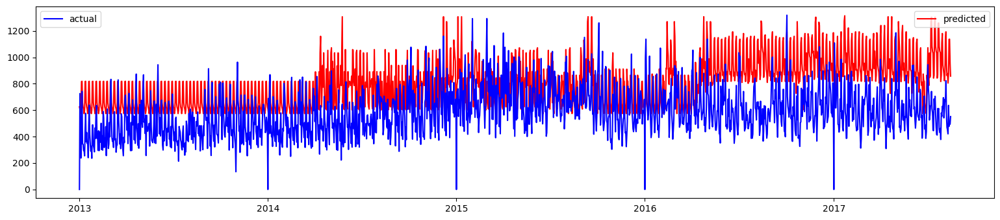

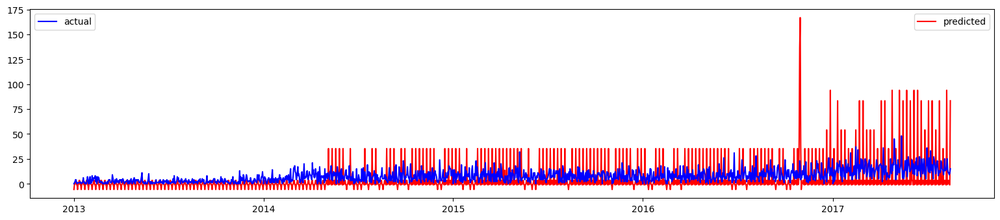

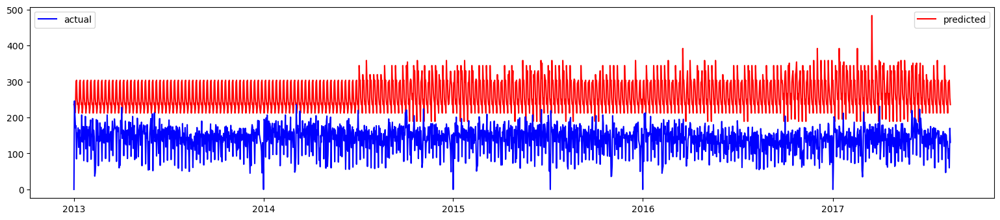

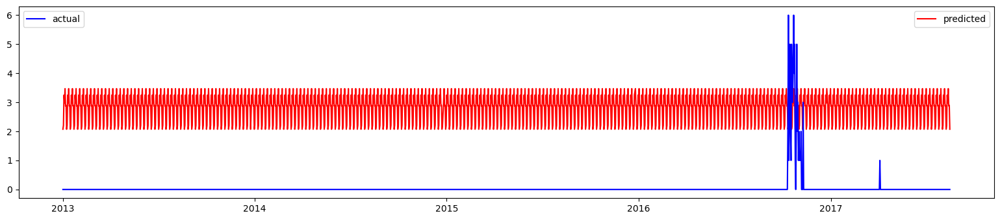

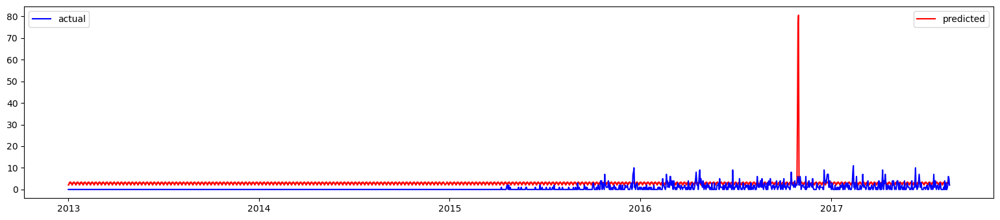

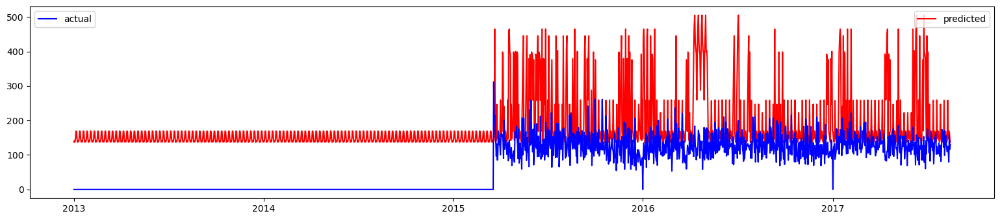

RMSE:  115.67436335858845
R2:  -8.948103968806066


In [138]:

rmse_list = []
r2_list = []
for i in range(0, 9):
    nn_data_ts = (fp_train_df.query(f'store_family== "{train_list[i]}"')
                      [['store_family', 'onpromotion','DoW_sin', 'DoW_cos', 'WoY_cos', 'WoY_sin']])
    targ_ts = (fp_train_df.query(f'store_family== "{train_list[i]}"')
                  ['y'])
    dates_df = fp_train_df.query(f'store_family== "{train_list[i]}"')[['store_family','ds']]
    # test_dataset = cb.Pool(nn_data_ts, targ_ts)
    pred = list(cat_model.predict(nn_data_ts).reshape(-1))
    rmse = (np.sqrt(mean_squared_error(targ_ts, pred)))
    y_test = list(targ_ts)
    r2 = r2_score(y_test, pred)
    rmse_list.append(rmse)
    r2_list.append(r2)
    _pred_df = pd.DataFrame({'actual':list(targ_ts),
                 'prediction':list(pred)})
    _pred_df['store_family'] = train_list[i]
    # break
    _pred_df['ds'] = dates_df['ds'].values
    # break
    _pred_df = _pred_df.sort_values(['store_family','ds'])
    # break
    
    plt.rcParams["figure.figsize"] = [15.50, 3.50]
    plt.rcParams["figure.autolayout"] = True
    line1, = plt.plot(_pred_df['ds'], _pred_df['prediction'], '-r', label='predicted')
    line2, = plt.plot(_pred_df['ds'], _pred_df['actual'], '-b', label='actual')
    first_legend = plt.legend(handles=[line1], loc='upper right')
    plt.gca().add_artist(first_legend)
    plt.legend(handles=[line2], loc='upper left')
    plt.show()
    # break
print('RMSE: ', np.mean(rmse_list))
print('R2: ', np.mean(r2_list))


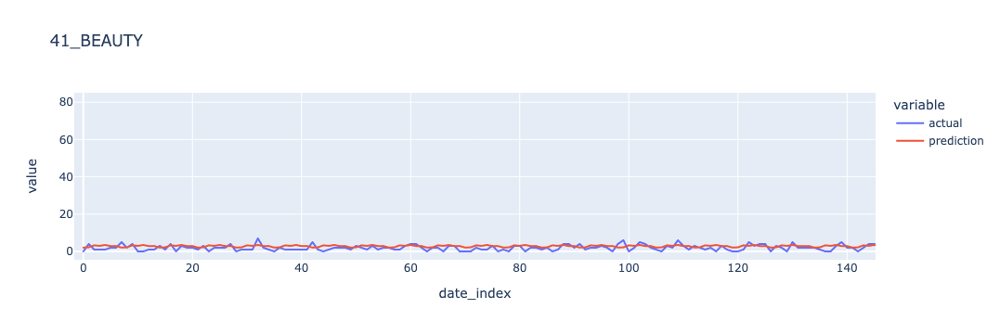

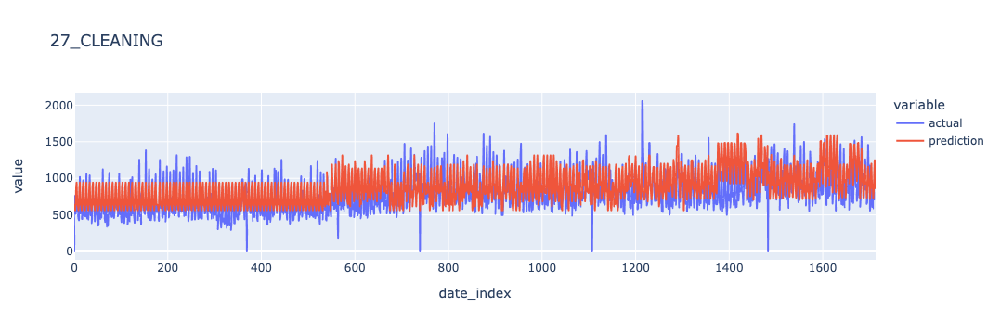

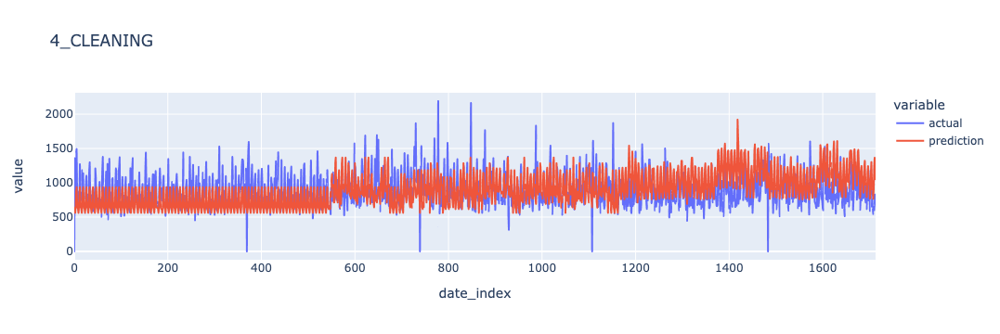

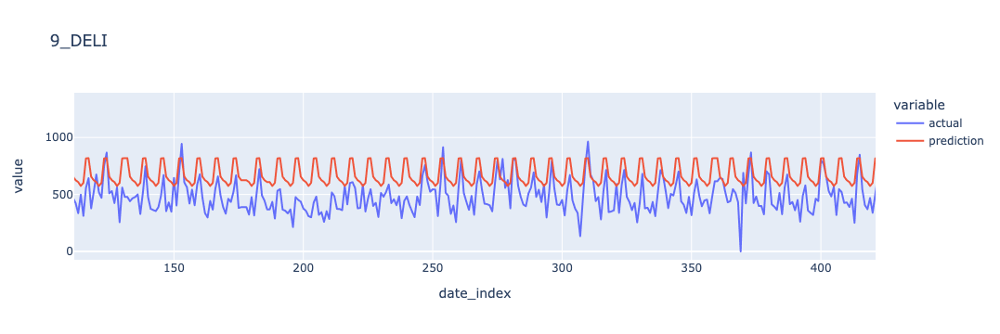

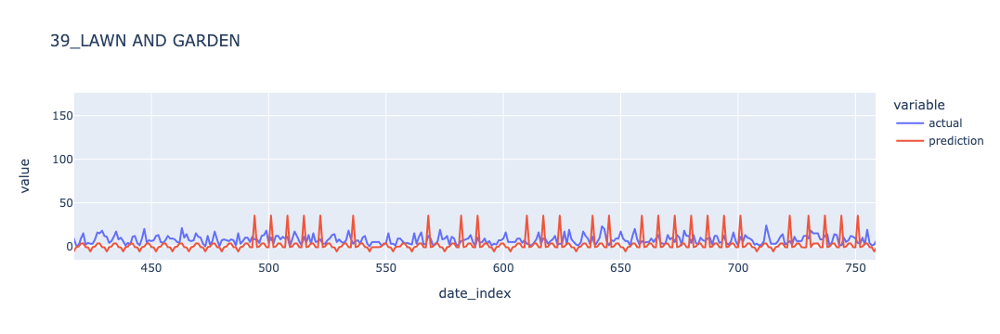

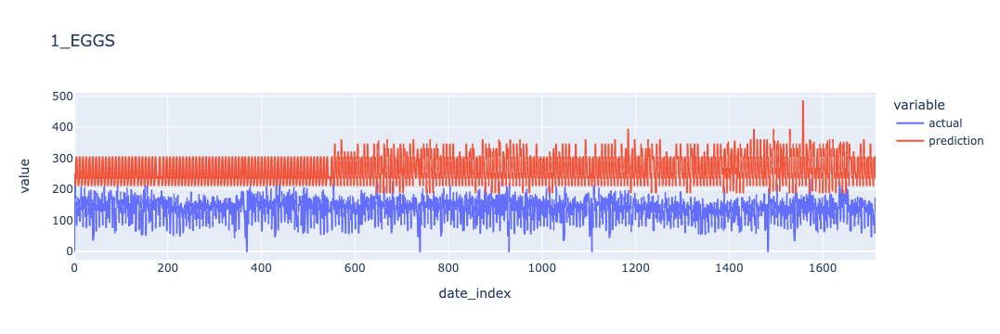

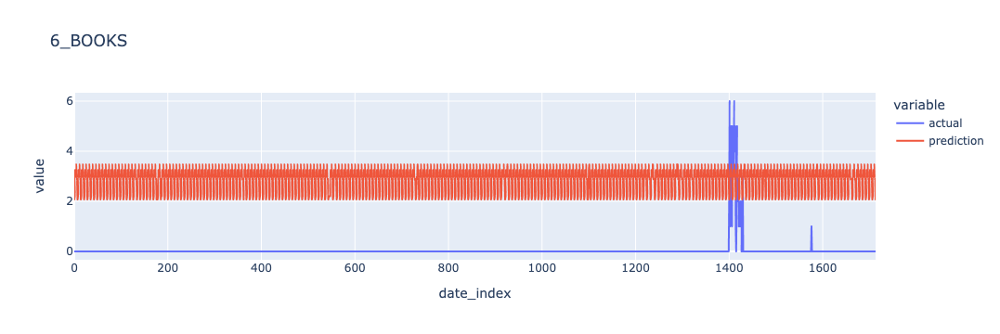

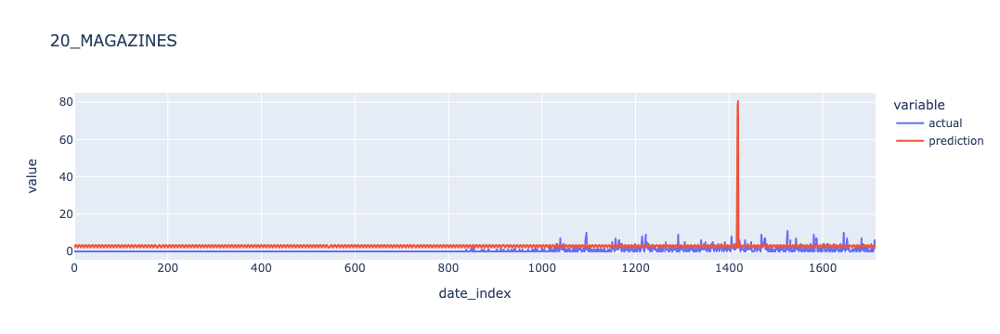

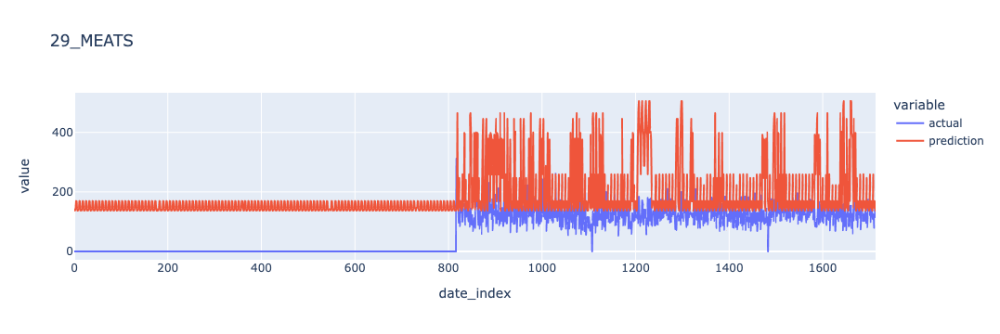

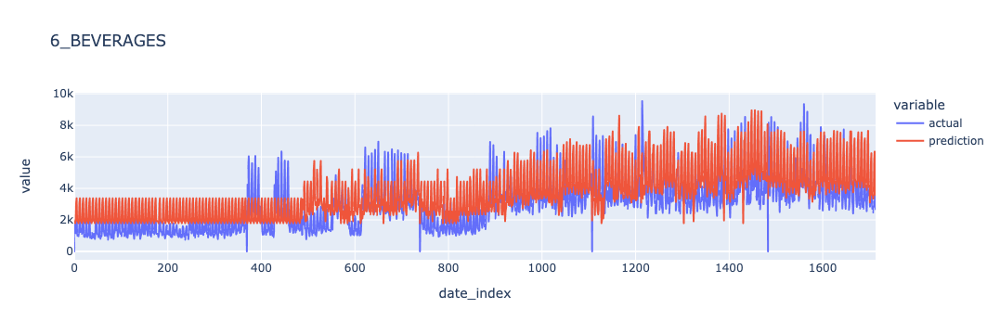

In [89]:
# test_list
for i in range(0,10):
    nn_data_ts = (fp_train_df.query(f'store_family== "{train_list[i]}"')
                  [['store_family', 'onpromotion','DoW_sin', 'DoW_cos', 'WoY_cos', 'WoY_sin']])
    targ_ts = (fp_train_df.query(f'store_family== "{train_list[i]}"')
                  ['y'])
    # test_dataset = cb.Pool(nn_data_ts, targ_ts)
    pred = list(cat_model.predict(nn_data_ts).reshape(-1))
    rmse = (np.sqrt(mean_squared_error(targ_ts, pred)))
    # y_test = list(y_test)
    # r2 = r2_score(y_test, pred)
    # rmse_list.append(rmse)
    # r2_list.append(r2)
    _pred_df = pd.DataFrame({'actual':list(targ_ts),
                 'prediction':list(pred)})
    _pred_df['article_country'] = train_list[i]
    _pred_df = _pred_df.reset_index().rename(columns={'index':'date_index'})
    fig = px.line(_pred_df, x='date_index', y=['actual', 'prediction'], 
                  title=train_list[i])
    fig.show()
# print(“Testing performance”)